<a href="https://colab.research.google.com/github/Raja904/sketch2image/blob/Raja904-patch-1/model_dev(pix2pix).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
import os
import pathlib
import time
import datetime
from matplotlib import pyplot as plt
from IPython import display

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf
import os

def load_image(input_path, output_path):
    input_image = tf.io.read_file(input_path)
    input_image = tf.image.decode_jpeg(input_image, channels=3)
    input_image = tf.image.resize(input_image, [256, 256])

    output_image = tf.io.read_file(output_path)
    output_image = tf.image.decode_jpeg(output_image, channels=3)
    output_image = tf.image.resize(output_image, [256, 256])

    return input_image, output_image

def random_jitter(input_image, output_image):
    input_image = tf.image.resize(input_image, [286, 286])
    output_image = tf.image.resize(output_image, [286, 286])

    stacked_image = tf.stack([input_image, output_image], axis=0)
    cropped_image = tf.image.random_crop(stacked_image, size=[2, 256, 256, 3])

    input_image, output_image = cropped_image[0], cropped_image[1]

    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        output_image = tf.image.flip_left_right(output_image)

    return input_image, output_image

def normalize(input_image, output_image):
    input_image = (input_image / 127.5) - 1
    output_image = (output_image / 127.5) - 1
    return input_image, output_image

def load_image_train(input_path, output_path):
    input_image, output_image = load_image(input_path, output_path)
    input_image, output_image = random_jitter(input_image, output_image)
    input_image, output_image = normalize(input_image, output_image)
    return input_image, output_image

def load_image_test(input_path, output_path):
    input_image, output_image = load_image(input_path, output_path)
    input_image, output_image = normalize(input_image, output_image)
    return input_image, output_image


def create_ordered_dataset(input_dir, output_dir):
    input_files = sorted([os.path.join(input_dir, file) for file in os.listdir(input_dir) if file.endswith('.jpg')])
    output_files = sorted([os.path.join(output_dir, file) for file in os.listdir(output_dir) if file.endswith('.jpg')])
    assert len(input_files) == len(output_files), "The number of input and output files must be the same."
    input_paths = tf.data.Dataset.from_tensor_slices(input_files)
    output_paths = tf.data.Dataset.from_tensor_slices(output_files)
    dataset = tf.data.Dataset.zip((input_paths, output_paths))
    return dataset


train_input_dir = '/content/drive/MyDrive/Physics Wallah Internship/Dataset/Train/Input'
train_output_dir = '/content/drive/MyDrive/Physics Wallah Internship/Dataset/Train/Output'
train_dataset = create_ordered_dataset(train_input_dir, train_output_dir)
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.batch(1)

test_input_dir = '/content/drive/MyDrive/Physics Wallah Internship/Dataset/Test/Input'
test_output_dir = '/content/drive/MyDrive/Physics Wallah Internship/Dataset/Test/Output'
test_dataset = create_ordered_dataset(test_input_dir, test_output_dir)
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(1)

val_input_dir = '/content/drive/MyDrive/Physics Wallah Internship/Dataset/Val/Input'
val_output_dir = '/content/drive/MyDrive/Physics Wallah Internship/Dataset/Val/Output'
val_dataset = create_ordered_dataset(val_input_dir, val_output_dir)
val_dataset = val_dataset.map(load_image_test)
val_dataset = val_dataset.batch(1)


In [ ]:
for example_input, example_target in train_dataset.take(1):
    print("Input Image Shape:", example_input.shape)
    print("Output Image Shape:", example_target.shape)
    inp = example_input

Input Image Shape: (1, 256, 256, 3)
Output Image Shape: (1, 256, 256, 3)


In [ ]:
import tensorflow as tf
import os

def load_image(image_file, channels):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=channels)  # Ensure the correct number of channels
    image = tf.image.resize(image, [256, 256])
    image = (image / 127.5) - 1
    return image

def load_image_pair(input_file, output_file):
    input_image = load_image(input_file, channels=1)  # Grayscale input
    input_image = tf.image.grayscale_to_rgb(input_image)  # Convert grayscale to RGB
    output_image = load_image(output_file, channels=3)  # RGB output
    return input_image, output_image

def load_image_train(input_file, output_file):
    input_image, output_image = load_image_pair(input_file, output_file)
    input_image = tf.reshape(input_image, [256, 256, 3])  # Ensure the shape is correct
    output_image = tf.reshape(output_image, [256, 256, 3])  # Ensure the shape is correct
    return input_image, output_image

def load_image_test(input_file, output_file):
    input_image, output_image = load_image_pair(input_file, output_file)
    input_image = tf.reshape(input_image, [256, 256, 3])  # Ensure the shape is correct
    output_image = tf.reshape(output_image, [256, 256, 3])  # Ensure the shape is correct
    return input_image, output_image

def create_dataset(input_dir, output_dir):
    # List input files and output files
    input_files = sorted([os.path.join(input_dir, file) for file in os.listdir(input_dir) if file.endswith('.jpg')])
    output_files = sorted([os.path.join(output_dir, file) for file in os.listdir(output_dir) if file.endswith('.jpg')])

    # Check if both lists are of the same length
    assert len(input_files) == len(output_files), "The number of input and output files must be the same."

    # Create TensorFlow datasets from the file lists
    input_paths = tf.data.Dataset.from_tensor_slices(input_files)
    output_paths = tf.data.Dataset.from_tensor_slices(output_files)

    # Zip the datasets to pair corresponding input and output files
    dataset = tf.data.Dataset.zip((input_paths, output_paths))
    return dataset

# Create TensorFlow datasets for train, test, and val
train_input_dir = '/content/drive/MyDrive/Physics Wallah Internship/Dataset/Train/Input'
train_output_dir = '/content/drive/MyDrive/Physics Wallah Internship/Dataset/Train/Output'
train_dataset = create_dataset(train_input_dir, train_output_dir)
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.batch(1)

test_input_dir = '/content/drive/MyDrive/Physics Wallah Internship/Dataset/Test/Input'
test_output_dir = '/content/drive/MyDrive/Physics Wallah Internship/Dataset/Test/Output'
test_dataset = create_dataset(test_input_dir, test_output_dir)
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(1)

val_input_dir = '/content/drive/MyDrive/Physics Wallah Internship/Dataset/Val/Input'
val_output_dir = '/content/drive/MyDrive/Physics Wallah Internship/Dataset/Val/Output'
val_dataset = create_dataset(val_input_dir, val_output_dir)
val_dataset = val_dataset.map(load_image_test)
val_dataset = val_dataset.batch(1)

# Example usage of the generator with test dataset
for example_input, example_target in train_dataset.take(1):
    print("Input Image Shape:", example_input.shape)
    print("Output Image Shape:", example_target.shape)
    inp = example_input


Input Image Shape: (1, 256, 256, 3)
Output Image Shape: (1, 256, 256, 3)


In [ ]:
path = '/content/drive/MyDrive/Physics Wallah Internship/Dataset'
image = tf.io.read_file('/content/drive/MyDrive/Physics Wallah Internship/Dataset/Train/Input/1.jpg')
inp = tf.io.read_file('/content/drive/MyDrive/Physics Wallah Internship/Dataset/Train/Output/1.jpg')
inp = tf.io.decode_jpeg(inp)
image = tf.io.decode_jpeg(image)
print(image.shape)

(256, 256, 1)


In [ ]:
inp.shape

TensorShape([256, 256, 3])

In [ ]:
# Defining encoder
def downsample(filters, size, apply_batchnorm = True):
  initializer = tf.random_normal_initializer(0.,0.02)
  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding = 'same',
                                    kernel_initializer=initializer, use_bias = False))
  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())
  result.add(tf.keras.layers.LeakyReLU())
  return result

# Defining decoder
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)
  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                             kernel_initializer=initializer, use_bias=False))
  result.add(tf.keras.layers.BatchNormalization())
  if apply_dropout:
    result.add(tf.keras.layers.Dropout(0.5))
  result.add(tf.keras.layers.ReLU())
  return result


In [ ]:
# down_model = downsample(3, 4)
# down_result = down_model(tf.expand_dims(inp, 0))
# print (down_result.shape)

In [ ]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256,256,3])

  down_stack = [
      downsample(64,4, apply_batchnorm = False),
      downsample(128,4), # (bs, 64, 64, 128)
      downsample(256,4), # (bs, 32, 32, 256)
      downsample(512,4), # (bs, 16, 16, 512)
      downsample(512,4), # (bs, 8, 8, 512)
      downsample(512,4), # (bs, 4, 4, 512)
      downsample(512,4), # (bs, 2, 2, 512)
      downsample(512,4), # (bs, 1, 1, 512)

  ]

  up_stack = [
      upsample(512,4, apply_dropout=True), # (bs, 2, 2, 1024)
      upsample(512,4, apply_dropout=True), # (bs, 4, 4, 1024)
      upsample(512,4, apply_dropout=True), # (bs, 8, 8, 1024)
      upsample(512,4), # (bs, 16, 16, 1024)
      upsample(256,4), # (bs, 32, 32, 512)
      upsample(128,4), # (bs, 64, 64, 256)
      upsample(64,4),  # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(3, 4, strides = 2, padding = 'same', kernel_initializer = initializer, activation = 'tanh')


  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x) # skip connections after each encoder

  skips = reversed(skips[:-1])


  # Upsampling and establishing the skip connections

  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x,skip])

  x = last(x)

  return tf.keras.Model(inputs = inputs, outputs=x)




In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


## Defining Generator Loss


In [ ]:
LAMBDA = 100
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def gen_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + LAMBDA* l1_loss

  return total_gen_loss, gan_loss, l1_loss


# Discriminator

In [ ]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

    x = tf.keras.layers.concatenate([inp, tar])

    down1 = downsample(64, 4, False)(x)  # 128x128x64
    down2 = downsample(128, 4)(down1)    # 64x64x128
    down3 = downsample(256, 4)(down2)    # 32x32x256

    zero_pad = tf.keras.layers.ZeroPadding2D()(down3)  # 34x34x256
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                  kernel_initializer=initializer, use_bias=False)(zero_pad)  # 31x31x512

    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # 33x33x512

    last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2)  # 30x30x1

    return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [ ]:
discriminator = Discriminator()
discriminator.summary()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)


Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 concatenate_43 (Concatenat  (None, 256, 256, 6)          0         ['input_image[0][0]',         
 e)                                                                  'target_image[0][0]']        
                                                                                                  
 sequential_94 (Sequential)  (None, 128, 128, 64)         6144      ['concatenate_43[0][0]']

In [ ]:
# from PIL import Image
# import numpy as np

# import matplotlib.pyplot as plt

# inp = Image.open('/content/drive/MyDrive/Physics Wallah Internship/Dataset/Train/Output/1.jpg')

# input_array = np.array(inp)

# # Expand dimensions to match expected shape
# input_array = np.expand_dims(input_array, axis=-1)

# # Duplicate the single channel across all three channels
# inp = np.concatenate([input_array] * 3, axis=-1)

# # Ensure the input shape matches the expected shape of the generator model
# assert inp.shape == (256, 256, 3), "Input shape doesn't match the expected shape of the generator model"

In [ ]:
inp.shape

TensorShape([256, 256, 3])

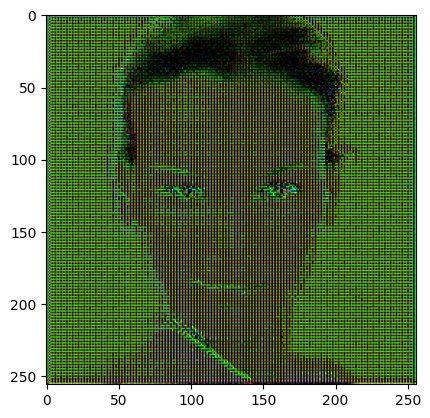

In [ ]:
gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

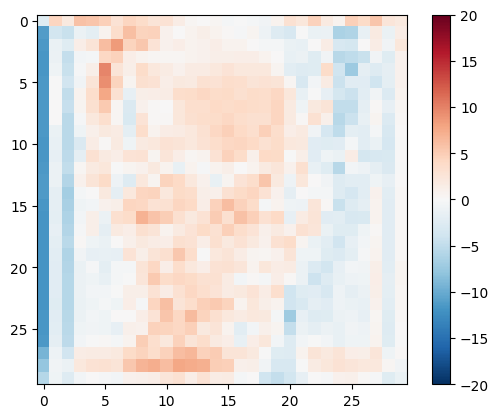

In [ ]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

## Discriminator Loss

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output),disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss


## Defining Optimizers

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1 = 0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1 = 0.5)


In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

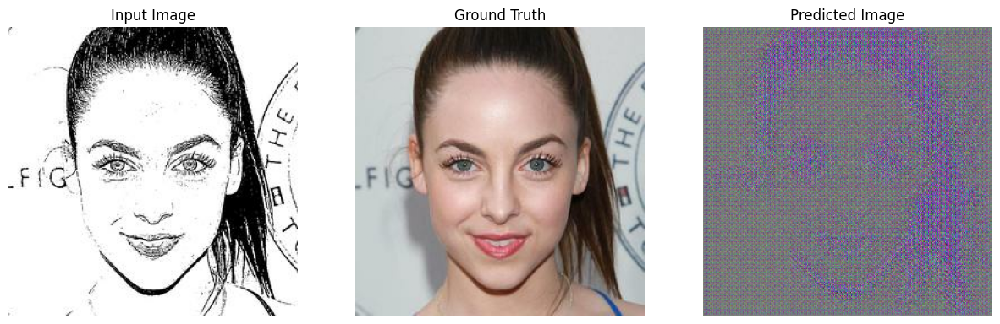

In [ ]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

In [ ]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = gen_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)




In [ ]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

In [ ]:
logdir = '/content/logs'

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

Time taken for 1000 steps: 308.80 sec



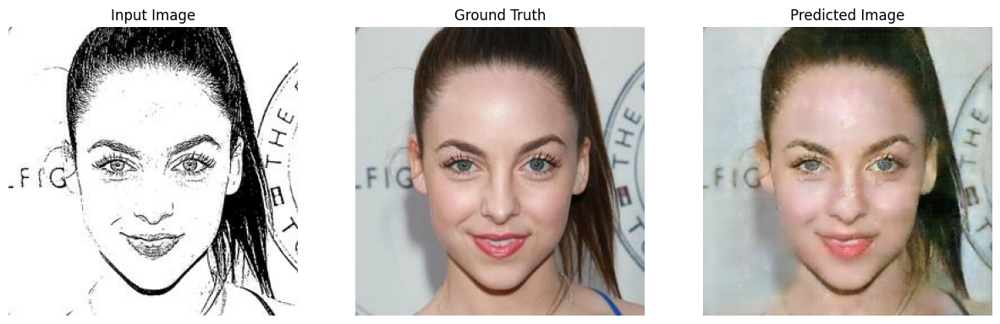

Step: 23k
.................................................................................................

In [ ]:
fit(train_dataset, test_dataset, steps=40000)

In [ ]:
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)

NameError: name 'test_dataset' is not defined